# Task 2 - Helmet and Mask Prediction

In [1]:
!pip install xmltodict
import os, cv2, random
dataset_dir = "./dataset"
if not os.path.isdir(dataset_dir):
    !unzip dataset.zip
import numpy as np
import json, xmltodict
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import warnings
warnings.simplefilter('ignore')

from sklearn.utils import class_weight
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2, ResNet50V2
from tensorflow.keras.layers import AveragePooling2D, MaxPooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.resnet_v2 import preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [2]:
new_dataset_dir, images, annotation = [os.path.join(dataset_dir, x) for x in os.listdir(dataset_dir)]
print('Total Images: ', len(os.listdir(images)))

Total Images:  591


## Convert the XML Annotations to Python readable format

- Converting XML to a Dictionary in python for ease of preocessing.

In [3]:
with open(annotation) as xml_file:
    data_dict = xmltodict.parse(xml_file.read())
    
json_data = json.dumps(data_dict)

with open("data.json", "w") as json_file:
        json_file.write(json_data)
        
with open("data.json", "r") as json_file:
        data_dict = json.load(json_file)

In [4]:
image_annotations = data_dict['annotations']['image']

## Exploring the Dataset

- Extracting only the heads, even tough the dataset has information regarding clothing and gloves.

In [5]:
def get_bbox(index):
    '''Extract Bounding Boxes from the Dataset Dictionary'''
    boxes = dict()
    count = 0
    img_path = os.path.join(new_dataset_dir, image_annotations[index]['@id'] + '.jpg')
    for box in image_annotations[index]['box']:
        if type(box) == str:
            continue
        if box['@label'] == 'head':
            count += 1
            boxes[count] = dict(img_path=img_path.replace('.jpg', f'_{count}.jpg'), xmin=int(float(box['@xtl'])), ymin=int(float(box['@ytl'])), xmax=int(float(box['@xbr'])), ymax=int(float(box['@ybr'])))
            if 'attribute' in box:
                for attribute in box['attribute']:
                    if attribute['@name'] == 'mask':
                        boxes[count]['mask'] = attribute['#text']
                    elif attribute['@name'] == 'has_safety_helmet':
                        boxes[count]['helmet'] = attribute['#text']
    return boxes
    
def get_image(index):
    '''Load images from the List of Image data present'''
    img_path = os.path.join(images, image_annotations[index]['@id'] + '.jpg')
    img = cv2.imread(img_path)
    boxes = get_bbox(index)
    for box in boxes:
        xmin, ymin, xmax, ymax = boxes[box]['xmin'], boxes[box]['ymin'], boxes[box]['xmax'], boxes[box]['ymax']
        img = cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0,255,0), 3)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def plot_image(img):
    '''Plot image using matplotlib'''
    plt.figure(figsize=(16,9))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

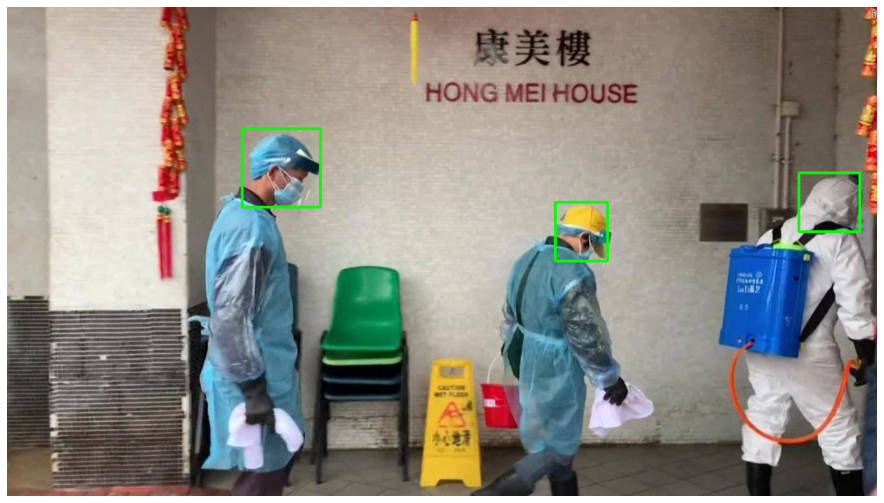

In [6]:
plot_image(get_image(10))

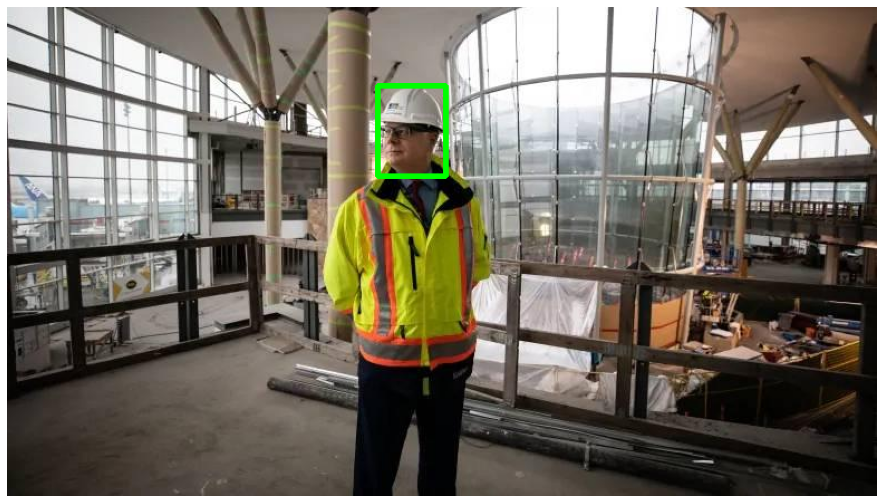

In [7]:
plot_image(get_image(-1))

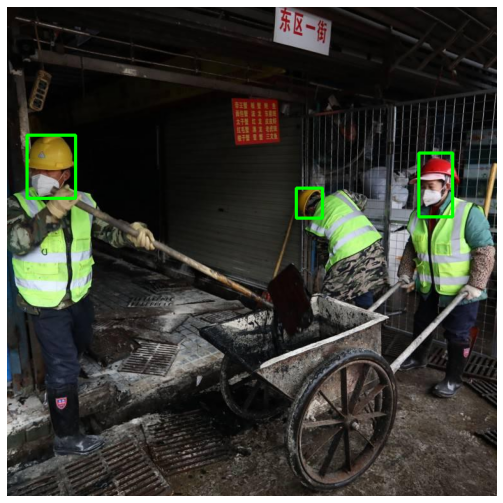

In [8]:
plot_image(get_image(20))

## Cropping out heads from the dataset to create a new dataset for Model Training.

In [9]:
images_, masks_, helmets_ = list(), list(), list()

for i in tqdm(range(len(image_annotations))):
    original_img = os.path.join(images, image_annotations[i]['@id'] + '.jpg')
    original_img = cv2.imread(original_img)
    boxes = get_bbox(i)
    for box in boxes:
        box = boxes[box]
        img_path = box['img_path']
        xmin, ymin, xmax, ymax = box['xmin'], box['ymin'], box['xmax'], box['ymax']
        mask, helmet = box['mask'], box['helmet']
        cv2.imwrite(img_path, original_img[ymin:ymax, xmin:xmax])
        images_.append(img_path); masks_.append(mask); helmets_.append(helmet)
        
new_dataset = pd.DataFrame()
new_dataset['image'], new_dataset['mask'], new_dataset['helmet'] = images_, masks_, helmets_
new_dataset = new_dataset[new_dataset['mask'] != 'wrong']
mask_dataset = new_dataset[['image', 'mask']]
helmet_dataset = new_dataset[['image', 'helmet']]
new_dataset.head()

100%|██████████| 527/527 [00:01<00:00, 294.39it/s]


,image,mask,helmet
0,./dataset/new_dataset/0_1.jpg,yes,yes
1,./dataset/new_dataset/0_2.jpg,no,yes
2,./dataset/new_dataset/1_1.jpg,yes,no
3,./dataset/new_dataset/2_1.jpg,invisible,yes
4,./dataset/new_dataset/2_2.jpg,no,yes


In [10]:
print("Number of images in new datset: ", new_dataset.shape[0])

Number of images in new datset:  1781


## Distribution of Classes in New Dataset

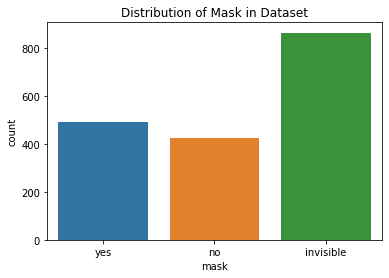

In [11]:
sns.countplot(new_dataset['mask'])
plt.title('Distribution of Mask in Dataset')
plt.show()

- The imbalance in classes needs to be corrected by using either class_weights while training or by upsampling data points with less samples.

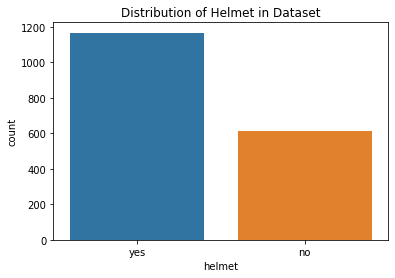

In [12]:
sns.countplot(new_dataset['helmet'])
plt.title('Distribution of Helmet in Dataset')
plt.show()

- The imbalance in classes needs to be corrected by using either class_weights while training or by upsampling data points with less samples.

In [14]:
def upsample_data(dataset, random_state = 10):
    '''Randomly sample data points and add it to the dataset for classes with less samples'''
    if 'mask' in dataset.columns:
        label = 'mask'
    else:
        label = 'helmet'
    n = dataset[label].value_counts().max()
    dfs = list()
    for class_ in dataset[label].unique():
        dfs.append(dataset[dataset[label] == class_].sample(n=n, replace=True, random_state=random_state))

    balanced_dataset = pd.concat(dfs, axis=0, ignore_index=True)
    balanced_dataset = balanced_dataset.sample(frac=1, random_state=random_state).reset_index(drop=True)
    return balanced_dataset

## Upsampling to Reduce Imbalance in Dataset

In [15]:
mask_dataset = upsample_data(mask_dataset)
helmet_dataset = upsample_data(helmet_dataset)

In [16]:
mask_train_val, mask_test = train_test_split(mask_dataset, test_size=0.2, stratify=mask_dataset['mask'])
mask_train, mask_val = train_test_split(mask_train_val, test_size=0.25, stratify=mask_train_val['mask'])
print("Train Size\t:", mask_train.shape)
print("Val Size\t:", mask_val.shape)
print("Test Size\t:", mask_test.shape)

Train Size	: (1557, 2)
Val Size	: (519, 2)
Test Size	: (519, 2)


In [17]:
helmet_train_val, helmet_test = train_test_split(helmet_dataset, test_size=0.2, stratify=helmet_dataset['helmet'])
helmet_train, helmet_val = train_test_split(helmet_train_val, test_size=0.25, stratify=helmet_train_val['helmet'])
print("Train Size\t:", helmet_train.shape)
print("Val Size\t:", helmet_val.shape)
print("Test Size\t:", helmet_test.shape)

Train Size	: (1400, 2)
Val Size	: (467, 2)
Test Size	: (467, 2)


In [18]:
TARGET_SHAPE = (224, 224, 3)
BATCH_SIZE = 16

## Load Dataset
- Initialize Image Data Generators

In [19]:
train_datagen = ImageDataGenerator(rotation_range=20,
                                   zoom_range=0.15,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   shear_range=0.15,
                                   preprocessing_function=preprocess_input,
                                   horizontal_flip=True,
                                   fill_mode="nearest")

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

In [20]:
mask_train_dataloader = train_datagen.flow_from_dataframe(mask_train, 
                                                          x_col='image',
                                                          y_col='mask',
                                                          batch_size=BATCH_SIZE,
                                                          target_size=TARGET_SHAPE[:2], 
                                                          class_mode='categorical')

mask_val_dataloader = test_datagen.flow_from_dataframe(mask_val, 
                                                          x_col='image',
                                                          y_col='mask',
                                                          batch_size=BATCH_SIZE,
                                                          target_size=TARGET_SHAPE[:2], 
                                                          class_mode='categorical')

mask_test_dataloader = test_datagen.flow_from_dataframe(mask_test, 
                                                          x_col='image',
                                                          y_col='mask',
                                                          batch_size=BATCH_SIZE,
                                                          target_size=TARGET_SHAPE[:2], 
                                                          class_mode='categorical')

Found 1557 validated image filenames belonging to 3 classes.
Found 519 validated image filenames belonging to 3 classes.
Found 519 validated image filenames belonging to 3 classes.


In [21]:
helmet_train_dataloader = train_datagen.flow_from_dataframe(helmet_train, 
                                                          x_col='image',
                                                          y_col='helmet',
                                                          target_size=TARGET_SHAPE[:2], 
                                                          class_mode='categorical')

helmet_val_dataloader = test_datagen.flow_from_dataframe(helmet_val, 
                                                          x_col='image',
                                                          y_col='helmet',
                                                          target_size=TARGET_SHAPE[:2], 
                                                          class_mode='categorical')

helmet_test_dataloader = test_datagen.flow_from_dataframe(helmet_test, 
                                                          x_col='image',
                                                          y_col='helmet',
                                                          target_size=TARGET_SHAPE[:2], 
                                                          class_mode='categorical')

Found 1400 validated image filenames belonging to 2 classes.
Found 467 validated image filenames belonging to 2 classes.
Found 467 validated image filenames belonging to 2 classes.


In [22]:
def load_classes(generator):
    '''Load all the class labels from generator to a numpy array'''
    batch_index = 0
    generator.batch_index = 0
    data = generator.next()
    classes = data[1]
    batch_index = batch_index + 1
    while batch_index <= generator.batch_index:
        data = generator.next()
        classes = np.vstack([classes, data[1]])
        batch_index = batch_index + 1
    return classes

def plot_confusion_matrix(y_true, y_pred, labels):
    '''Plot Confusion Matrix, Precision Matrix, Recall Matrix and F1 Matrix'''
    C = confusion_matrix(y_true, y_pred)
    A = (C.T/C.sum(axis=1)).T
    B = C/C.sum(axis=0)
    D = 2*A*B/(A+B)
    
    plt.figure(figsize=(20, 4))
    cmap = 'Blues'
    plt.subplot(1,4,1)
    sns.heatmap(C, annot=True, fmt='g', xticklabels=labels, yticklabels=labels, cbar=False, lw=1, linecolor='black', cmap=cmap)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class', rotation=90)
    plt.title("Confusion Matrix")
    
    plt.subplot(1,4,2)
    sns.heatmap(B, annot=True, fmt='.3f', xticklabels=labels, yticklabels=labels, cbar=False, lw=1, linecolor='black', cmap=cmap)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class', rotation=90)
    plt.title("Precision Matrix")
    
    plt.subplot(1,4,3)
    sns.heatmap(A, annot=True, fmt='.3f', xticklabels=labels, yticklabels=labels, cbar=False, lw=1, linecolor='black', cmap=cmap)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class', rotation=90)
    plt.title("Recall Matrix")
    
    plt.subplot(1,4,4)
    sns.heatmap(D, annot=True, fmt='.3f', xticklabels=labels, yticklabels=labels, cbar=False, lw=1, linecolor='black', cmap=cmap)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class', rotation=90)
    plt.title("F-1 Matrix")
    plt.tight_layout(w_pad=3)
    plt.show()
    
def evaluate_model(model, train, y_train, test, y_test):
    '''Generate Prediction and Plot Confusion Matrices'''
    y_pred_train = np.asarray(model.predict(train))
    y_pred_test = np.asarray(model.predict(test))
    
    y_train_class = tf.argmax(y_pred_train, axis=1)
    y_test_class = tf.argmax(y_pred_test, axis=1)
    
    y_train = tf.argmax(y_train, axis=1)
    y_test = tf.argmax(y_test, axis=1)
    
    labels = list(train.class_indices.keys())
    
    print("\n\n", "="*60,  "TRAIN", "="*60, "\n\n")
    print(classification_report(y_train, y_train_class))
    plot_confusion_matrix(y_train, y_train_class, labels)
    print("\n\n", "="*60,  "TEST", "="*60, "\n\n")
    print(classification_report(y_test, y_test_class))
    plot_confusion_matrix(y_test, y_test_class, labels)

In [23]:
INIT_LR = 1e-3
EPOCHS = 100

## Training Model for Mask Detection

In [24]:
tf.keras.backend.clear_session()
random_state = 0
random.seed(random_state)
np.random.seed(random_state)
os.environ["PYTHONHASHSEED"] = str(random_state)

baseModel = ResNet50V2(weights="imagenet", include_top=False, input_tensor=Input(shape=TARGET_SHAPE))

for layer in baseModel.layers:
    layer.trainable = False
    
x = baseModel.output
x = AveragePooling2D(pool_size=(7, 7))(x)
x = Flatten(name="flatten")(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(64, activation="relu")(x)
x = Dropout(0.5)(x)
output = Dense(3, activation="softmax")(x)

mask_model = Model(inputs=baseModel.input, outputs=output)

opt = Adam(lr=INIT_LR, decay = INIT_LR / EPOCHS)
mask_model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

In [25]:
checkpoint = ModelCheckpoint(filepath='mask_model.h5', monitor='val_accuracy', mode='max', save_best_only=True)
earlystop = EarlyStopping(monitor='val_accuracy', patience=30, mode='max')
mask_model.fit(mask_train_dataloader, validation_data=mask_val_dataloader, epochs=EPOCHS, callbacks=[checkpoint, earlystop])

Epoch 1/100
98/98 [==============================] - 27s 218ms/step - loss: 1.3233 - accuracy: 0.4057 - val_loss: 0.9720 - val_accuracy: 0.5376
Epoch 2/100
98/98 [==============================] - 19s 197ms/step - loss: 0.9761 - accuracy: 0.5094 - val_loss: 0.8984 - val_accuracy: 0.5723
Epoch 3/100
98/98 [==============================] - 19s 197ms/step - loss: 0.9658 - accuracy: 0.5102 - val_loss: 0.8244 - val_accuracy: 0.6146
Epoch 4/100
98/98 [==============================] - 19s 197ms/step - loss: 0.8796 - accuracy: 0.5701 - val_loss: 0.8395 - val_accuracy: 0.6243
Epoch 5/100
98/98 [==============================] - 19s 199ms/step - loss: 0.8968 - accuracy: 0.5650 - val_loss: 0.7953 - val_accuracy: 0.6532
Epoch 6/100
98/98 [==============================] - 19s 196ms/step - loss: 0.8982 - accuracy: 0.5560 - val_loss: 0.8084 - val_accuracy: 0.6243
Epoch 7/100
98/98 [==============================] - 19s 196ms/step - loss: 0.8722 - accuracy: 0.5822 - val_loss: 0.8012 - val_accuracy:

In [26]:
mask_y_train = load_classes(mask_train_dataloader)
mask_y_test = load_classes(mask_test_dataloader)

## Evaluating Mask Model Performance

**Key Performance Metric: Precision**

- Since not wearing appropriate face Mask and Safety helmet could lead to serious implications for the workers health and safety, we will use **Precision** to evaluate the performance.

- We need a model such that, everytime a mask and helmet is detected it has to have a maximum confidence score, ie. the False Positive Rate should be very less/tight whereas there could be some leeway in the False Negative Rate

- In simple words the model has to be 100% sure or close when it infers that a person is wearing a mask or safety helmet



 ============================================================ TRAIN ============================================================ 


              precision    recall  f1-score   support

           0       0.78      0.85      0.81       519
           1       0.79      0.81      0.80       519
           2       0.79      0.71      0.75       519

    accuracy                           0.79      1557
   macro avg       0.79      0.79      0.79      1557
weighted avg       0.79      0.79      0.79      1557



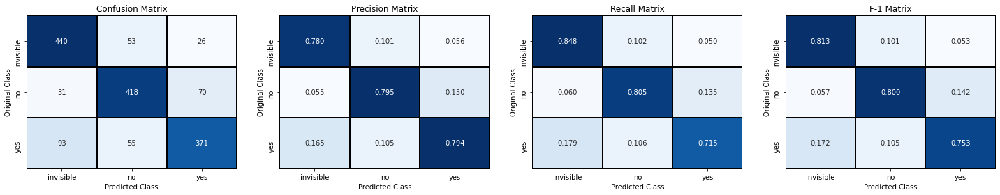



 ============================================================ TEST ============================================================ 


              precision    recall  f1-score   support

           0       0.74      0.76      0.75       173
           1       0.77      0.84      0.80       173
           2       0.78      0.69      0.74       173

    accuracy                           0.76       519
   macro avg       0.77      0.76      0.76       519
weighted avg       0.77      0.76      0.76       519



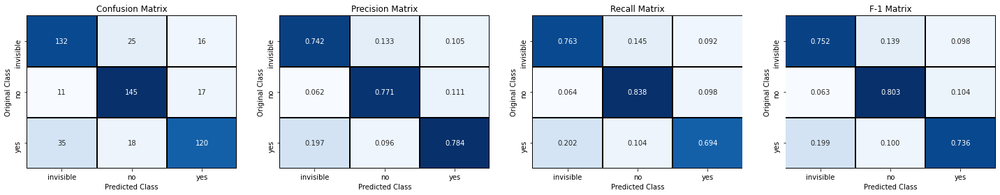

In [27]:
evaluate_model(mask_model, mask_train_dataloader, mask_y_train, mask_test_dataloader, mask_y_test)

- Overall decent performance can be observed for Mask Detection on both Train and test Data.
- We've achieved accuracy of 75 % - 79 % on seen and unseen data
- Whereas Precision, Recall and F1 are also in similar ranges of 75% - 80%
- Most importantly we'll need to improve the Average Precision i.e. currently at 77 %

## Training Model for Helmet Detection

In [28]:
tf.keras.backend.clear_session()
random_state = 0
random.seed(random_state)
np.random.seed(random_state)
os.environ["PYTHONHASHSEED"] = str(random_state)

baseModel = ResNet50V2(weights="imagenet", include_top=False, input_tensor=Input(shape=TARGET_SHAPE))

for layer in baseModel.layers:
    layer.trainable = False
    
x = baseModel.output
x = AveragePooling2D(pool_size=(7, 7))(x)
x = Flatten(name="flatten")(x)
x = Dense(128, activation="relu")(x)
x = Dropout(0.5)(x)
x = Dense(64, activation="relu")(x)
x = Dropout(0.5)(x)
output = Dense(2, activation="softmax")(x)

helmet_model = Model(inputs=baseModel.input, outputs=output)

opt = Adam(lr=INIT_LR, decay = INIT_LR / EPOCHS)
helmet_model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=["accuracy"])

In [29]:
checkpoint = ModelCheckpoint(filepath='helmet_model.h5', monitor='val_accuracy', mode='max', save_best_only=True)
earlystop = EarlyStopping(monitor='val_accuracy', patience=30, mode='max')
helmet_model.fit(helmet_train_dataloader, validation_data=helmet_val_dataloader, epochs=EPOCHS, callbacks=[checkpoint, earlystop])

Epoch 1/100
44/44 [==============================] - 22s 416ms/step - loss: 0.9155 - accuracy: 0.5665 - val_loss: 0.4649 - val_accuracy: 0.7752
Epoch 2/100
44/44 [==============================] - 16s 371ms/step - loss: 0.6303 - accuracy: 0.6764 - val_loss: 0.4218 - val_accuracy: 0.8051
Epoch 3/100
44/44 [==============================] - 16s 372ms/step - loss: 0.5879 - accuracy: 0.6882 - val_loss: 0.4692 - val_accuracy: 0.7537
Epoch 4/100
44/44 [==============================] - 16s 371ms/step - loss: 0.5518 - accuracy: 0.7112 - val_loss: 0.4054 - val_accuracy: 0.8116
Epoch 5/100
44/44 [==============================] - 17s 376ms/step - loss: 0.5319 - accuracy: 0.7447 - val_loss: 0.3944 - val_accuracy: 0.8308
Epoch 6/100
44/44 [==============================] - 16s 373ms/step - loss: 0.5063 - accuracy: 0.7420 - val_loss: 0.4008 - val_accuracy: 0.8116
Epoch 7/100
44/44 [==============================] - 16s 372ms/step - loss: 0.4789 - accuracy: 0.7747 - val_loss: 0.3884 - val_accuracy:

In [30]:
helmet_y_train = load_classes(helmet_train_dataloader)
helmet_y_test = load_classes(helmet_test_dataloader)



 ============================================================ TRAIN ============================================================ 


              precision    recall  f1-score   support

           0       0.90      0.91      0.91       700
           1       0.91      0.90      0.91       700

    accuracy                           0.91      1400
   macro avg       0.91      0.91      0.91      1400
weighted avg       0.91      0.91      0.91      1400



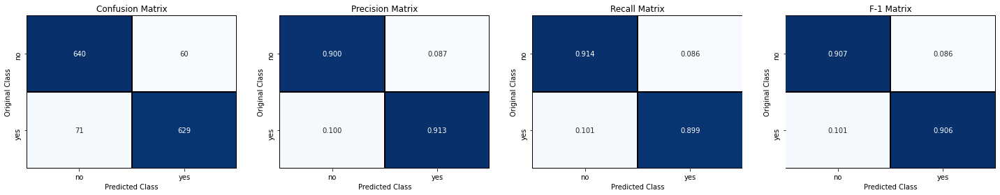



 ============================================================ TEST ============================================================ 


              precision    recall  f1-score   support

           0       0.83      0.86      0.85       233
           1       0.86      0.82      0.84       234

    accuracy                           0.84       467
   macro avg       0.84      0.84      0.84       467
weighted avg       0.84      0.84      0.84       467



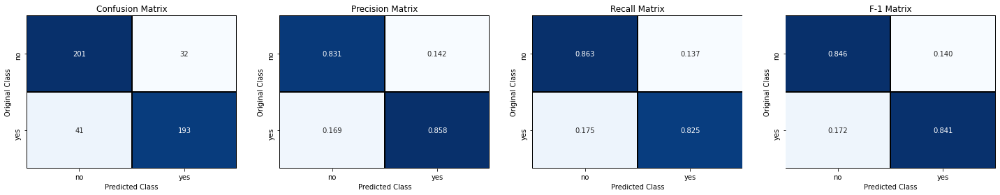

In [31]:
evaluate_model(helmet_model, helmet_train_dataloader, helmet_y_train, helmet_test_dataloader, helmet_y_test)

- Overall better performance can be observed for Helmet Detection on both Train and test Data.
- We've achieved accuracy of 84 % - 91 % on seen and unseen data
- Whereas Precision, Recall and F1 are also in similar ranges of 84% - 91%
- Most importantly we'll have to improve the Average Precision i.e. currently at 84 %

In [66]:
def inference_pipeline(index):
    '''Run inference on samples and save it in a dictionary'''
    mask_labels = ['invisible', 'no', 'yes']
    helmet_labels = ['no', 'yes']
    original_img = os.path.join(images, image_annotations[index]['@id'] + '.jpg')
    original_img = cv2.cvtColor(cv2.imread(original_img), cv2.COLOR_BGR2RGB)
    boxes = get_bbox(index)
    for box in boxes:
        box = boxes[box]
        img_path = box['img_path']
        xmin, ymin, xmax, ymax = box['xmin'], box['ymin'], box['xmax'], box['ymax']
        img = cv2.resize(original_img[ymin:ymax, xmin:xmax], TARGET_SHAPE[:2])
        img = np.expand_dims(preprocess_input(img), axis=0)
        box['predicted_mask'] = mask_labels[tf.argmax(mask_model.predict(img), axis=1).numpy()[0]]
        box['predicted_helmet'] = helmet_labels[tf.argmax(helmet_model.predict(img), axis=1).numpy()[0]]
    return boxes

def get_color(label):
    '''Returns appropriate colors for class labels'''
    if label == 'no':
        return (255,0,0)
    elif label == 'invisible':
        return (255,255,0)
    else:
        return (0,255,0)

def plot_prediction(index):
    '''Plots the predictions on the original image'''
    original_img = os.path.join(images, image_annotations[index]['@id'] + '.jpg')
    original_img = cv2.cvtColor(cv2.imread(original_img), cv2.COLOR_BGR2RGB)
    boxes = inference_pipeline(index)
    for box in boxes:
        box = boxes[box]
        xmin, ymin, xmax, ymax = box['xmin'], box['ymin'], box['xmax'], box['ymax']
        mask, helmet = box['predicted_mask'], box['predicted_helmet']
        original_img = cv2.rectangle(original_img, (xmin, ymin), (xmax, ymax), (0,0,255), 3)
        original_img = cv2.putText(original_img, f"Mask: {mask.upper()}", (xmin, ymax+20), cv2.FONT_HERSHEY_SIMPLEX, 1, get_color(mask), 2)
        original_img = cv2.putText(original_img, f"Helmet: {helmet.upper()}", (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 1, get_color(helmet), 2)
    return plot_image(original_img)


## Sample Predictions

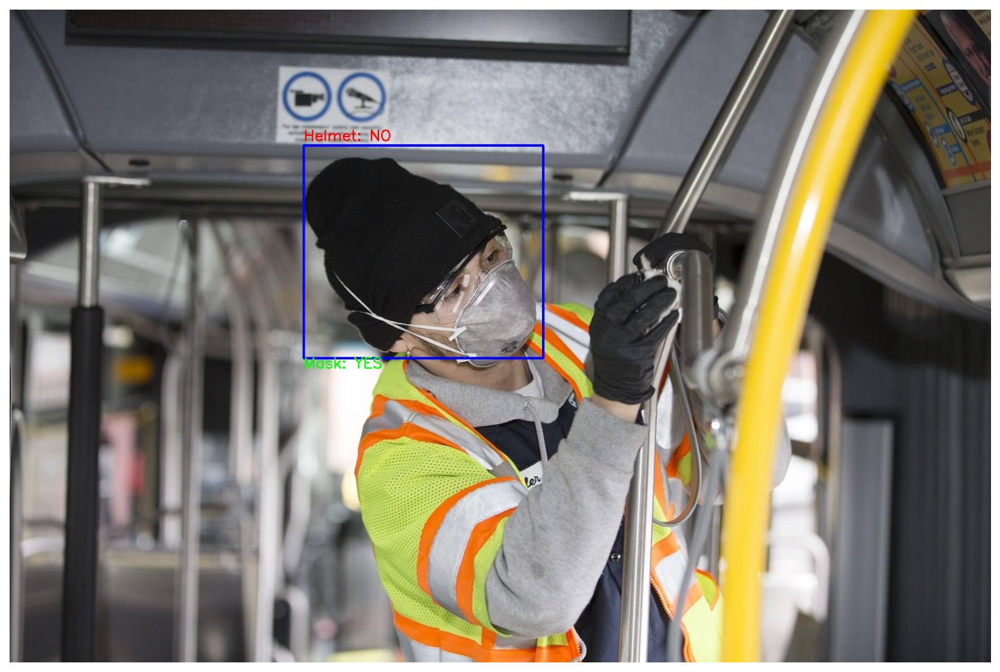

In [67]:
plot_prediction(1)

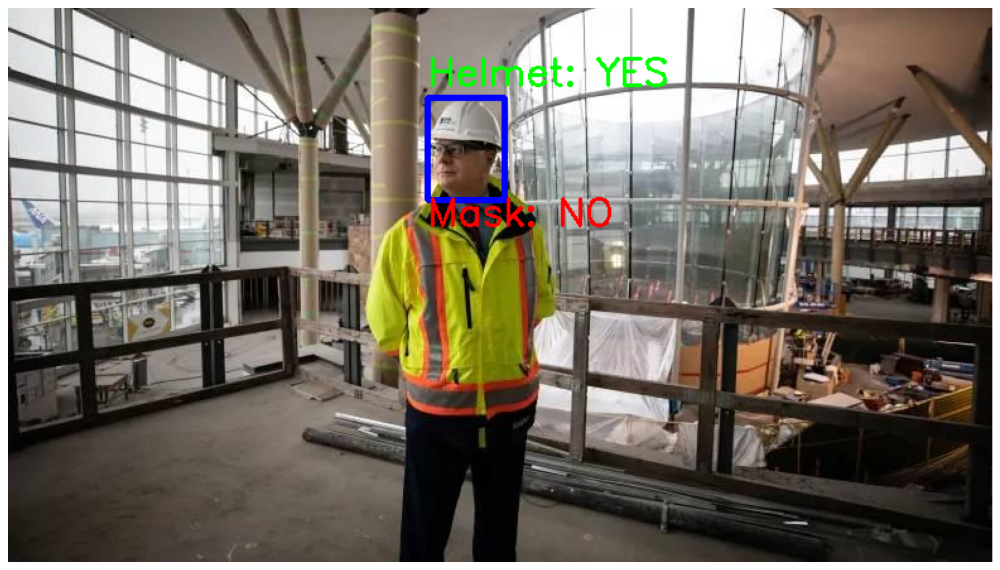

In [70]:
plot_prediction(-1)

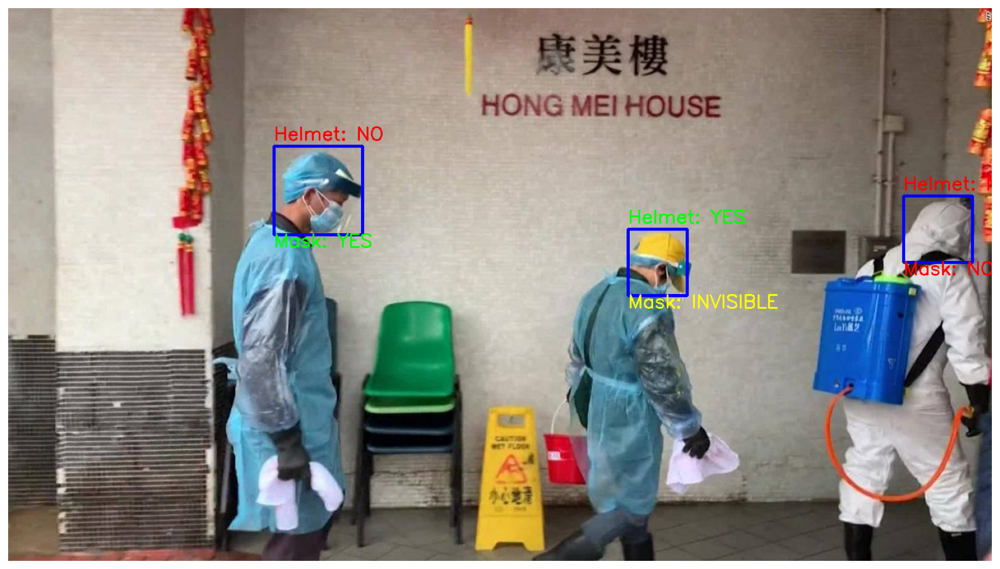

In [71]:
plot_prediction(10)

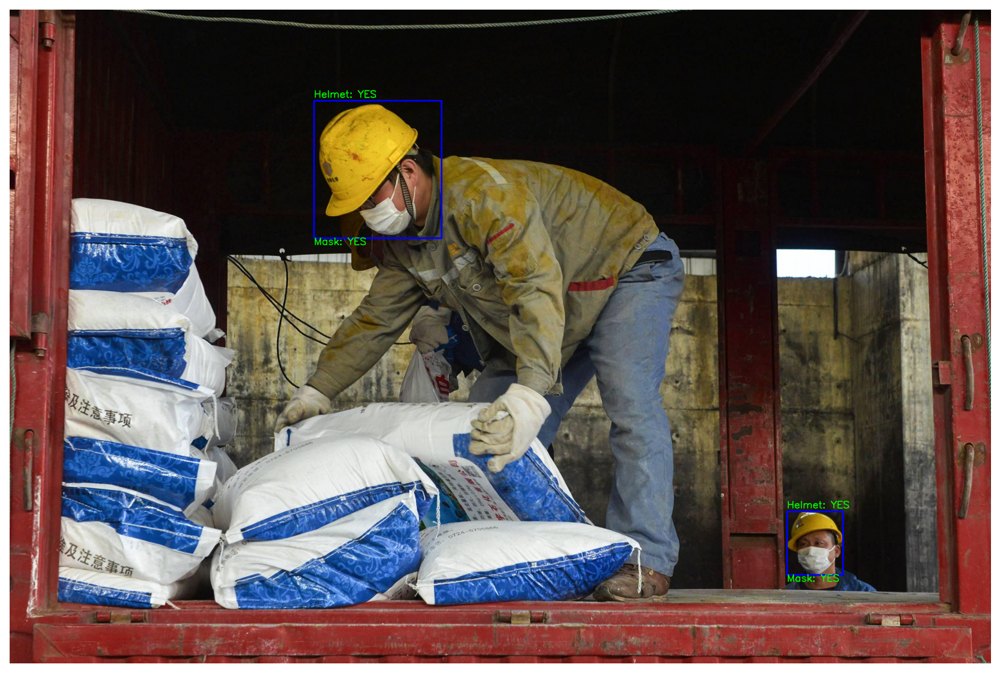

In [72]:
plot_prediction(30)